<a href="https://colab.research.google.com/github/ijanmejoydas/Easy-OCR-implementation/blob/main/Text_detection_using_easyocr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Text detection using EasyOcr


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


- EasyOCR is a python package that allows images to be converted to text.
- It is by far easiest and accuarate way to implement ocr which includes 70+ languages like English, Chinese, Japanese, Korean, Hindi, many more are being added. EasyOCR is created by the Jaided AI company.

- EasyOCR is built with Python and Pytorch deep learning library, having a GPU could speed up the whole process of detection. The detection part is using the CRAFT algorithm and the Recognition model is CRNN.

- It is composed of 3 main components, feature extraction (we are currently using Resnet), sequence labelling (LSTM) and decoding (CTC). EasyOCR doesn’t have much software dependencies, it can directly be used with its API. 

In [ ]:
#!apt-get install poppler-utils #linux based pdf rendering software
#!pip install easyocr #to implement ocr 
#!pip install pdf2image #wrapper of poppler-utils

In [ ]:
from pdf2image import convert_from_path
import easyocr
import numpy as np
import PIL
from PIL import ImageDraw
import spacy

- The above pdf2image package will convert pdf to images by getting its path.
- Using PIL to read images and draw the bounding boxes.
- Importing easyocr to implement ocr.
- Importing spacy to perform named entity recognition.

In [ ]:
reader = easyocr.Reader(['en'])

#here we initialize reader object to use english laguage

In [ ]:
images = convert_from_path('/content/ocr-docs.pdf')

#will return the list of images 

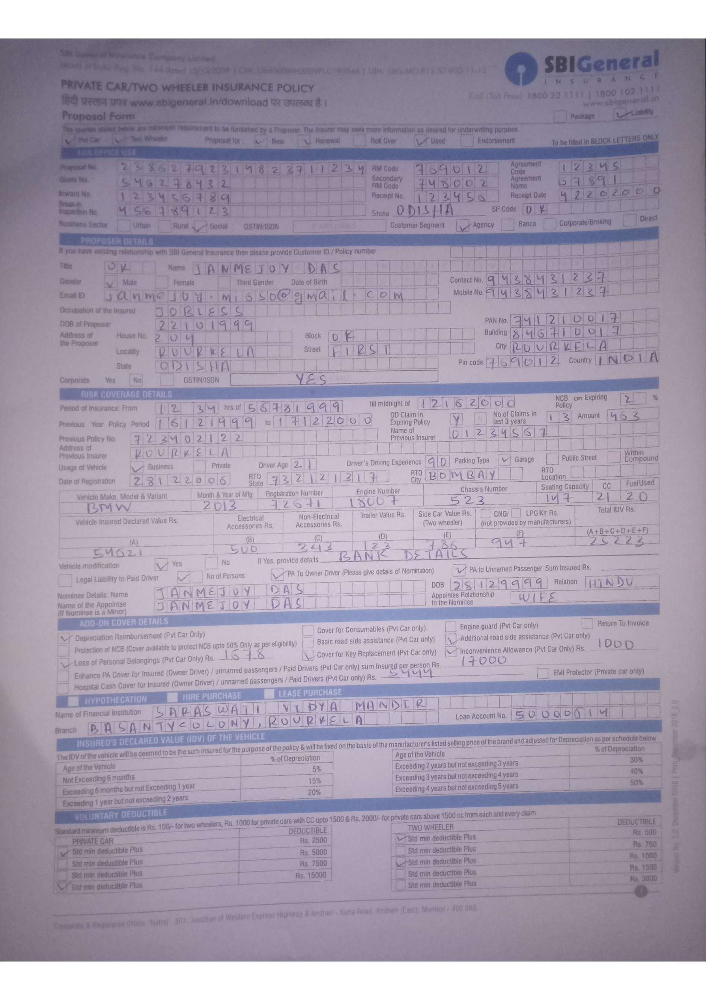

In [ ]:
from IPython.display import display, Image
display(images[0])

#displaying first image

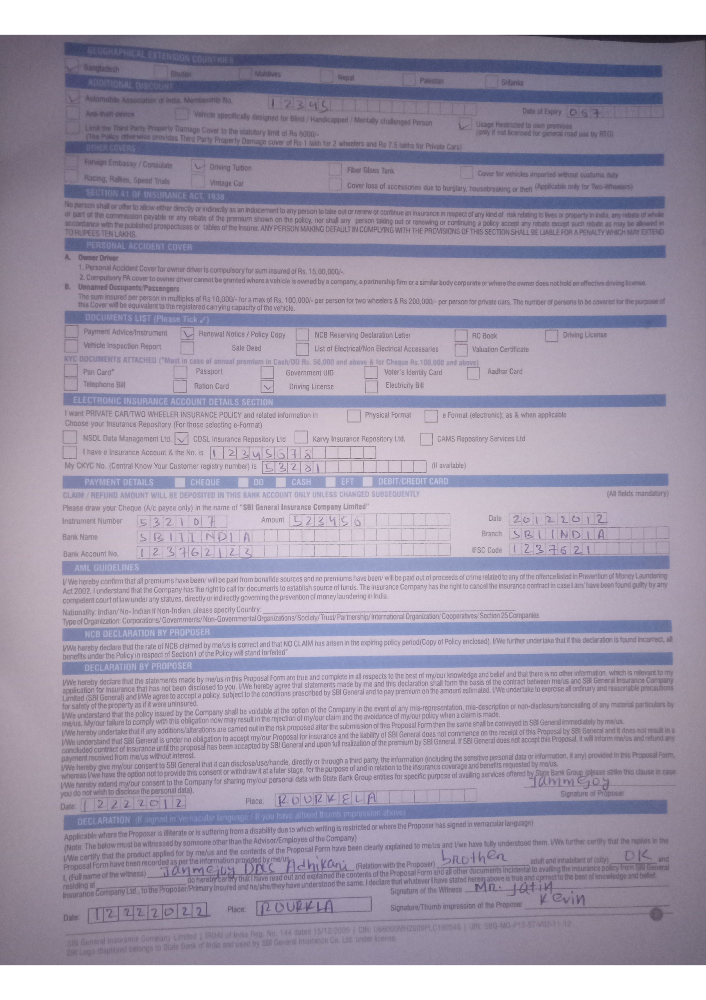

In [ ]:
from IPython.display import display, Image
display(images[1])

#displaying second image

In [ ]:
bounds = reader.readtext(np.array(images[0]), min_size=0, slope_ths=0.2, ycenter_ths=0.7, height_ths=0.6, width_ths=0.8,decoder='beamsearch', beamWidth=10)
bounds

[([[1264, 109], [1556, 109], [1556, 186], [1264, 186]],
  'SBIGeneral',
  0.7467318773269653),
 ([[295, 122], [508, 122], [508, 148], [295, 148]],
  '8;',
  8.58184830576647e-06),
 ([[858, 152], [1142, 152], [1142, 178], [858, 178]], '', 0.842964231967926),
 ([[701, 156], [845, 156], [845, 176], [701, 176]], '', 0.8692460656166077),
 ([[389, 157], [439, 157], [439, 173], [389, 173]], '', 0.8074108958244324),
 ([[1459, 173], [1479, 173], [1479, 193], [1459, 193]],
  '',
  0.1309596598148346),
 ([[1497, 173], [1513, 173], [1513, 189], [1497, 189]],
  '',
  0.22798217833042145),
 ([[1427, 179], [1445, 179], [1445, 195], [1427, 195]],
  'f',
  0.5175216197967529),
 ([[137, 180], [741, 180], [741, 224], [137, 224]],
  'PRIVAIE CAR/IWO WHEELER INSURANCE POuCY',
  0.03485407680273056),
 ([[1397, 181], [1413, 181], [1413, 197], [1397, 197]],
  'Q',
  0.34140458703041077),
 ([[1399, 192], [1550, 192], [1550, 232], [1399, 232]],
  '800 102_1111',
  0.03206082805991173),
 ([[1096, 212], [1372, 21

-  Constructing bounding barriers and boxes
- The above code extract all the contents of pdf files which previously converted to images.
- It gives the output of the bouding box location.

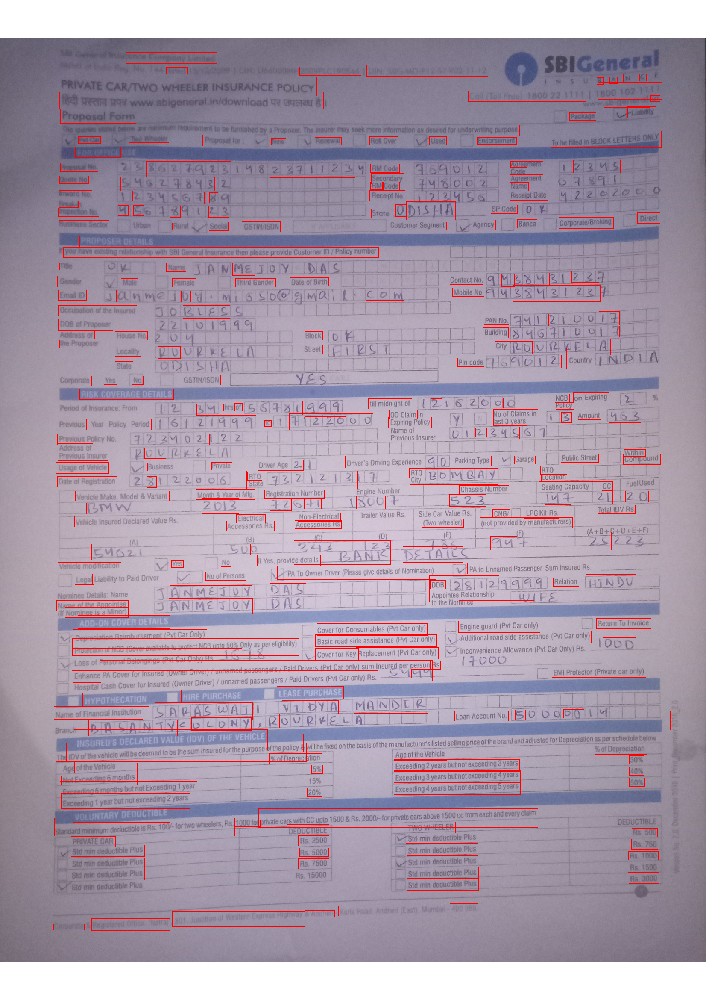

In [ ]:
def draw_boxes(image, bounds, color='red', width=1):
    draw = ImageDraw.Draw(image)
    for bound in bounds:
        p0, p1, p2, p3 = bound[0]
        draw.line([*p0, *p1, *p2, *p3, *p0], fill=color, width=width)
    return image

draw_boxes(images[0], bounds)

# function to iterate bouding box through all output which is extracted.

In [ ]:
len(bounds)

320

In [ ]:
for i in bounds:
    print(i[1])

# text

SBIGeneral
8;





f
PRIVAIE CAR/IWO WHEELER INSURANCE POuCY
Q
800 102_1111
:"5 ?21'!'
fet nKid HgT wmw sbigeneral in download I? 3IGcu $
spiganeral

rudollly
Proposal Form
Package
rysus##ugteguremen to 0t turnshed Dy9 Propoger me inaurgr mnay secx more ntoratinn as desued ter underwning purposa
To be tled In BLOCK LETTEAS ONLY

Pripoga toi

Rol Gver
Ussd
Rengual
Endarsemynt
Ie

zl2Ms
Aarcemeni
86}2174_23
241[1/1 2 3
FaNG%# lr
AM Gode
Gode
Secondary
Agreement
Goiu Hn
s992 1 8 1 3
nM
Code
Namne
Hecelot Dae
awaid lin
Receipt Mo.
2
>"<6 1
6
Gaar
DISAIA
0
SP Code
L

6
3
burcern hic
State
Direct
Corporate Broking
Banca
Agency
Husle9s Seclc
Urban
GSIIIISDN
Social
Gustomer Segmen
Fural
2100581202
you nave ensungrelallonshi Win SBI Ganeral Insurance then please provige Customer ID P Policy number
2v
M&
Y
Te
Mane
22
3
M
Gender
Contact No
Date ol Birth
Mdle
fernale
fd Gunder
>_313123_
Mobile No.
Email ID
a
Co I
m&
D
Ocrupatun al tne Insured
I&S
It
2
PAN No.
DDB ot Piuposer

7
Building
Address Ol

In [ ]:
text=''
for i in range(len(bounds)):
  text = text + bounds[i][1] +'\n'

print(text)

SBIGeneral
8;





f
PRIVAIE CAR/IWO WHEELER INSURANCE POuCY
Q
800 102_1111
:"5 ?21'!'
fet nKid HgT wmw sbigeneral in download I? 3IGcu $
spiganeral

rudollly
Proposal Form
Package
rysus##ugteguremen to 0t turnshed Dy9 Propoger me inaurgr mnay secx more ntoratinn as desued ter underwning purposa
To be tled In BLOCK LETTEAS ONLY

Pripoga toi

Rol Gver
Ussd
Rengual
Endarsemynt
Ie

zl2Ms
Aarcemeni
86}2174_23
241[1/1 2 3
FaNG%# lr
AM Gode
Gode
Secondary
Agreement
Goiu Hn
s992 1 8 1 3
nM
Code
Namne
Hecelot Dae
awaid lin
Receipt Mo.
2
>"<6 1
6
Gaar
DISAIA
0
SP Code
L

6
3
burcern hic
State
Direct
Corporate Broking
Banca
Agency
Husle9s Seclc
Urban
GSIIIISDN
Social
Gustomer Segmen
Fural
2100581202
you nave ensungrelallonshi Win SBI Ganeral Insurance then please provige Customer ID P Policy number
2v
M&
Y
Te
Mane
22
3
M
Gender
Contact No
Date ol Birth
Mdle
fernale
fd Gunder
>_313123_
Mobile No.
Email ID
a
Co I
m&
D
Ocrupatun al tne Insured
I&S
It
2
PAN No.
DDB ot Piuposer

7
Building
Address Ol

- performing same operation for page 2.

In [ ]:
bounds = reader.readtext(np.array(images[1]), min_size=0, slope_ths=0.2, ycenter_ths=0.7, height_ths=0.6, width_ths=0.8,decoder='beamsearch', beamWidth=10)
bounds

[([[196, 102], [502, 102], [502, 152], [196, 152]],
  'agerurN mnuoicous',
  4.557008850131217e-12),
 ([[190, 145], [284, 145], [284, 175], [190, 175]],
  'riagus?',
  0.0064415098167955875),
 ([[594, 163], [659, 163], [659, 183], [594, 183]],
  "Malle's",
  0.00368490070104599),
 ([[399, 165], [451, 165], [451, 181], [399, 181]], '', 0.0046028029173612595),
 ([[791, 175], [831, 175], [831, 191], [791, 191]],
  '"357}',
  0.01598420925438404),
 ([[199, 177], [401, 177], [401, 214], [199, 214]],
  'Leuusrruecoer',
  1.2854614594992597e-10),
 ([[981, 181], [1041, 181], [1041, 197], [981, 197]],
  'Paustan',
  0.2468545287847519),
 ([[1171, 183], [1227, 183], [1227, 203], [1171, 203]],
  'Slart',
  0.03492945805191994),
 ([[195, 218], [546, 218], [546, 246], [195, 246]],
  'N#onalsr Assvctata7 aHl Irstea Merrsshin A,',
  1.320983361759176e-12),
 ([[447, 229], [777, 229], [777, 293], [447, 293]],
  'vmiek sneshcdly asged lo elga surdr',
  7.710401067617667e-11),
 ([[662, 230], [714, 230], 

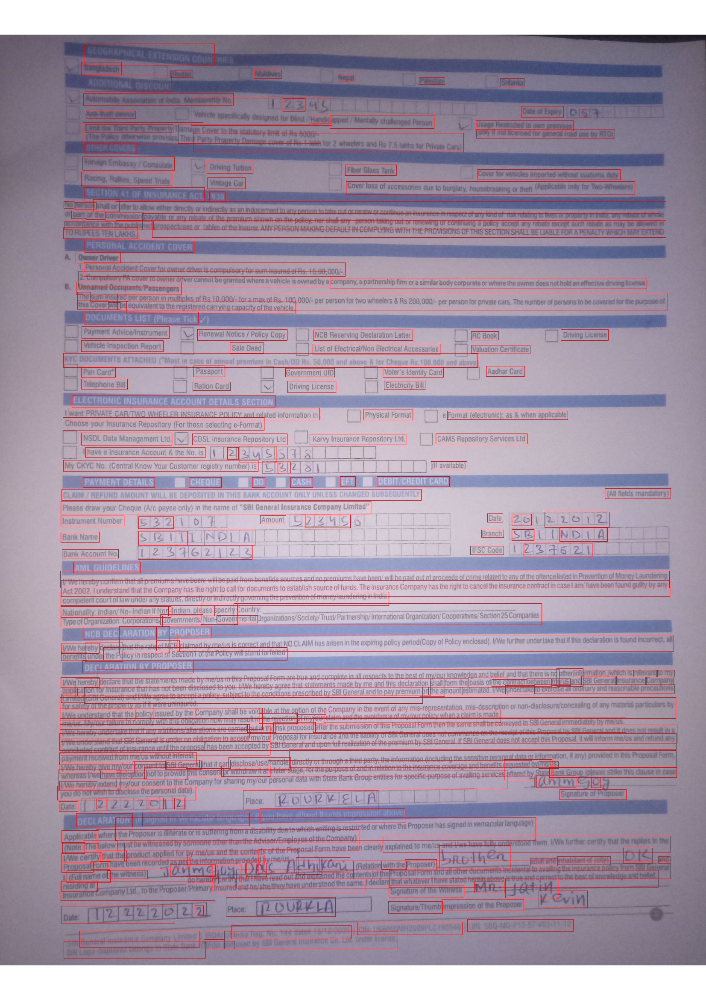

In [ ]:
def draw_boxes(image, bounds, color='red', width=1):
    draw = ImageDraw.Draw(image)
    for bound in bounds:
        p0, p1, p2, p3 = bound[0]
        draw.line([*p0, *p1, *p2, *p3, *p0], fill=color, width=width)
    return image

draw_boxes(images[1], bounds)

In [ ]:

len(bounds)

259

In [ ]:

for i in bounds:
    print(i[1])

agerurN mnuoicous
riagus?
Malle's

"357}
Leuusrruecoer
Paustan
Slart
N#onalsr Assvctata7 aHl Irstea Merrsshin A,
vmiek sneshcdly asged lo elga surdr
7s
Dalg Ol Eryy
"3

apyet Menidiy chadenged Persen
Hncir
ysaqe Pozucteg to tyn pGmetes
tunsjorervnse oorae panage
amge cave to De statdory lri ol As boon-
8
onyn notlcensed tor ganstaligadugs DHRIG
Paty Poperty Danage cove a Rs Vath to ? steelas and Rs 7Stats tor Pivde Cars)
a
foregn Embassy / Consulate
Irving Tunon
Fber Glass Tan+
Cuve lor venles aorted wuiout custos Guty
Racang, Rares, Speed Insls
Vinage Car
Cover loss Ol accessones due to burglary housebreatnq o telt Iorlcatle wkjty Tuc ineers|
narensue61
r3
shlo
ne
oisto atoweter dreclya ndrertyas an narcemento anyocrson totute qufa rerew a contnue an msurance mrespsct afanykrdat rst rdangte lvisa Gursrtyn tdu any tecced u
nusrn
pat
He
cunurussiun
paore or any cebate of te prenum shown on the pdicy nor shal any person tabng aut ar renewng or corurunga pdcyacceg ary retze ecepi such ode

In [ ]:
text=''
for i in range(len(bounds)):
  text = text + bounds[i][1] +'\n'

print(text)

agerurN mnuoicous
riagus?
Malle's

"357}
Leuusrruecoer
Paustan
Slart
N#onalsr Assvctata7 aHl Irstea Merrsshin A,
vmiek sneshcdly asged lo elga surdr
7s
Dalg Ol Eryy
"3

apyet Menidiy chadenged Persen
Hncir
ysaqe Pozucteg to tyn pGmetes
tunsjorervnse oorae panage
amge cave to De statdory lri ol As boon-
8
onyn notlcensed tor ganstaligadugs DHRIG
Paty Poperty Danage cove a Rs Vath to ? steelas and Rs 7Stats tor Pivde Cars)
a
foregn Embassy / Consulate
Irving Tunon
Fber Glass Tan+
Cuve lor venles aorted wuiout custos Guty
Racang, Rares, Speed Insls
Vinage Car
Cover loss Ol accessones due to burglary housebreatnq o telt Iorlcatle wkjty Tuc ineers|
narensue61
r3
shlo
ne
oisto atoweter dreclya ndrertyas an narcemento anyocrson totute qufa rerew a contnue an msurance mrespsct afanykrdat rst rdangte lvisa Gursrtyn tdu any tecced u
nusrn
pat
He
cunurussiun
paore or any cebate of te prenum shown on the pdicy nor shal any person tabng aut ar renewng or corurunga pdcyacceg ary retze ecepi such ode

In [ ]:
nlp=spacy.load('en_core_web_sm')
doc = nlp(text)

In [ ]:
from spacy import displacy
displacy.render(nlp(doc.text),style='ent', jupyter=True)

# performing name entity recognition to nlp spacy object